In [3]:
import csv
import operator
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

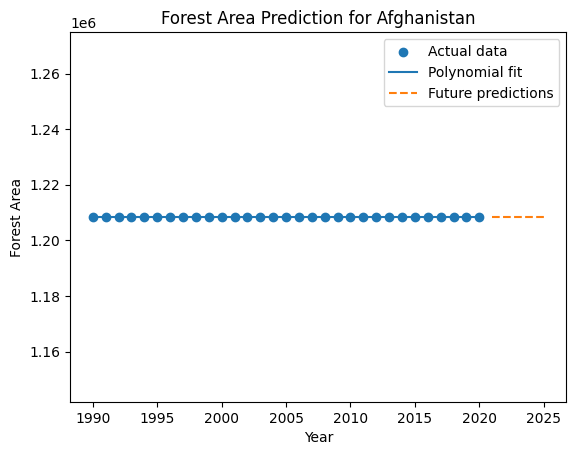

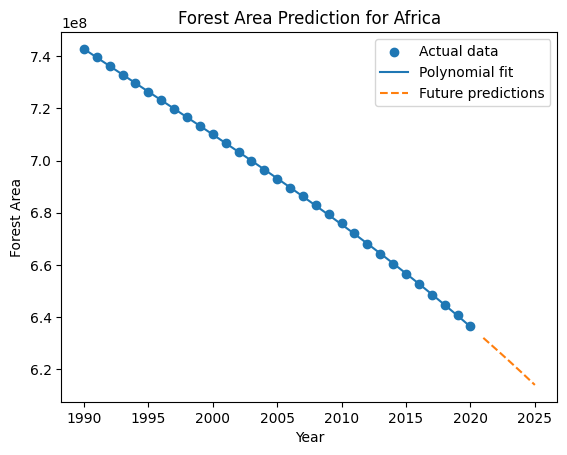

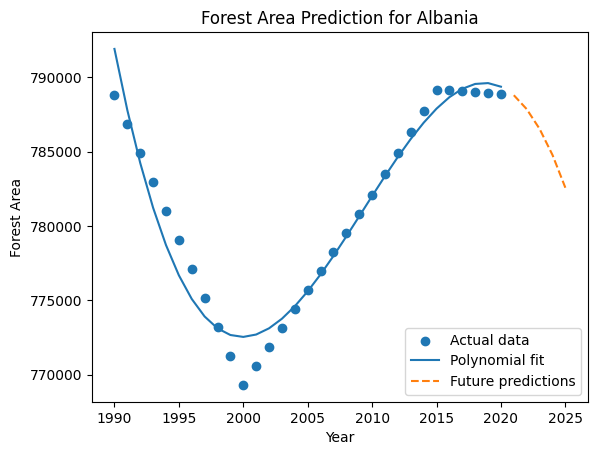

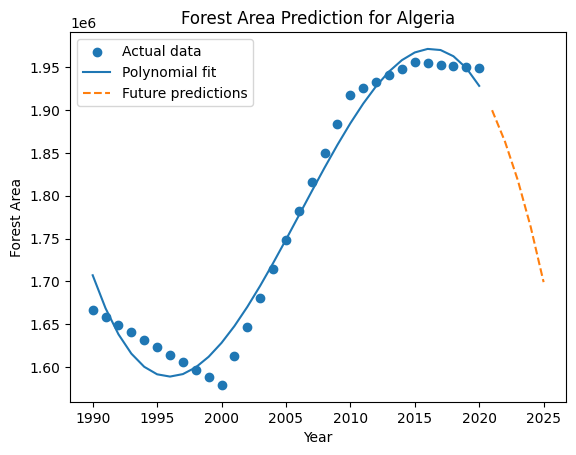

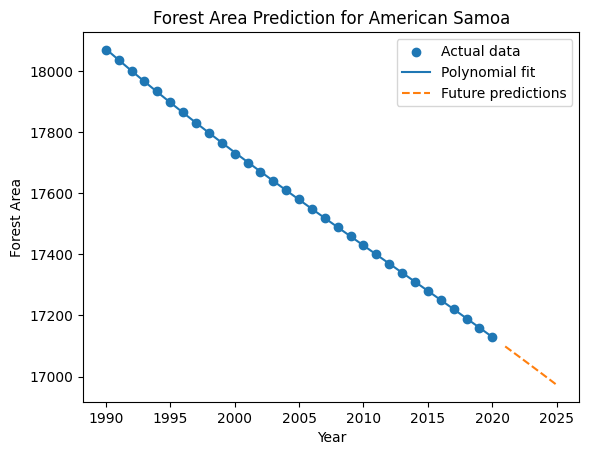

...

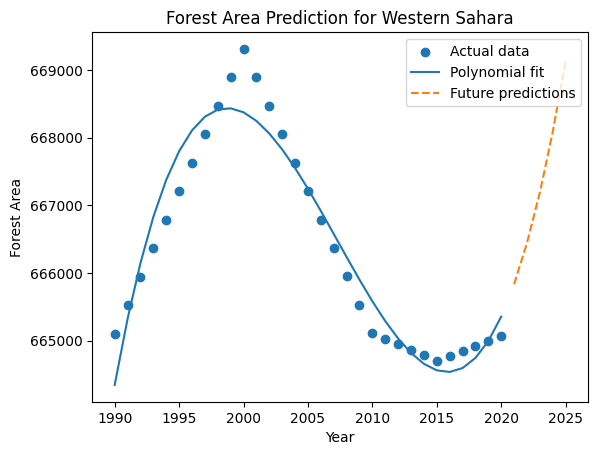

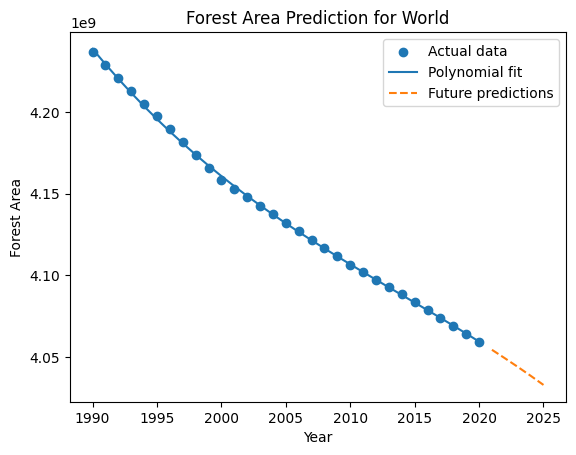

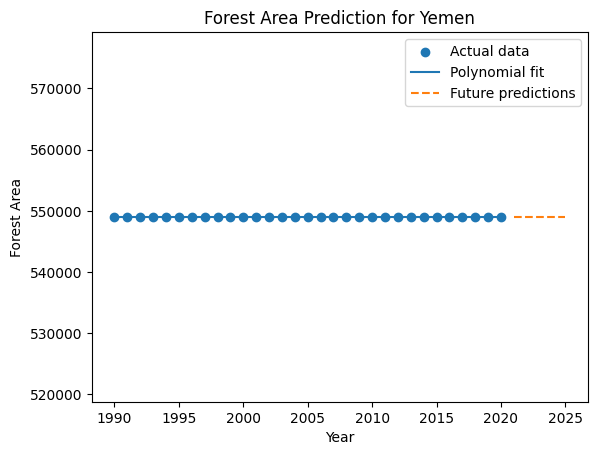

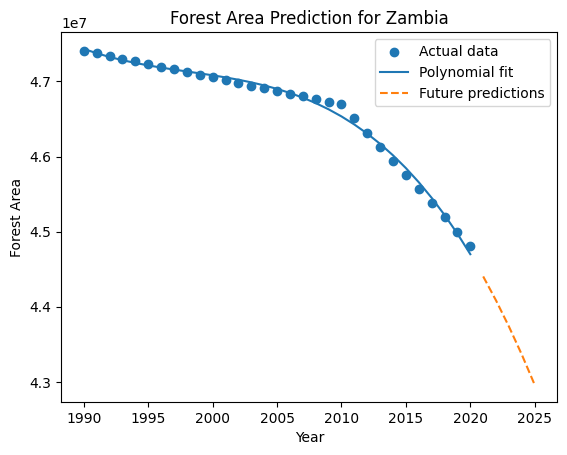

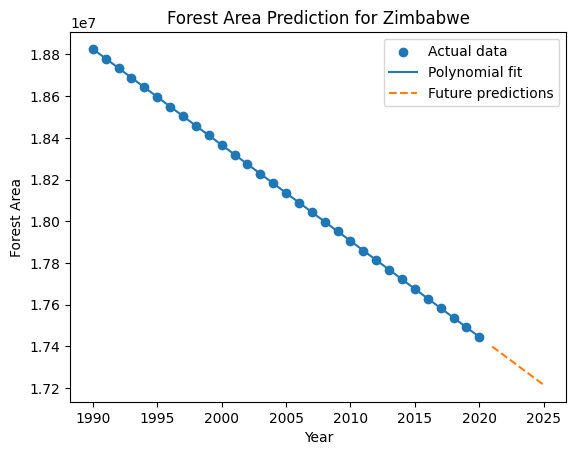

In [9]:
forest_df = pd.read_csv('../datasets/forest-area-km.csv')
year_column = 'Year'
forest_area_column = 'Forest area'

degree = 3
models = {}
predictions = {}

for country in forest_df['Entity'].unique():
    # Filter data for the current country
    country_df = forest_df[forest_df['Entity'] == country]
    
    # Prepare the data
    X = country_df[year_column].values.reshape(-1, 1)
    y = country_df[forest_area_column].values
    
    # Polynomial features transformation
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    
    # Fit the model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    # Store the model
    models[country] = model
    
    # Predict future forest area for this country
    future_years = np.arange(2021, 2026).reshape(-1, 1)  # Example future years
    future_years_poly = poly.transform(future_years)
    future_predictions = model.predict(future_years_poly)
    
    # Store predictions
    predictions[country] = future_predictions

    # Optionally, plot the fit and future predictions
    plt.scatter(X, y, label='Actual data')
    plt.plot(X, model.predict(X_poly), label='Polynomial fit')
    plt.plot(future_years, future_predictions, label='Future predictions', linestyle='--')
    plt.title(f'Forest Area Prediction for {country}')
    plt.xlabel('Year')
    plt.ylabel('Forest Area')
    plt.legend()
    plt.show()

degree = 3
future_years = np.arange(2024, 2125)  # Years for prediction

# Container for all predictions
all_predictions = []

for country in forest_df['Entity'].unique():
    country_df = forest_df[forest_df['Entity'] == country]
    
    X = country_df[year_column].values.reshape(-1, 1)
    y = country_df[forest_area_column].values
    
    # Transform to polynomial features
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    
    # Fit the model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    # Predict for future years
    future_years_poly = poly.transform(future_years.reshape(-1, 1))
    future_predictions = model.predict(future_years_poly)
    
    # Store predictions with corresponding country and years
    for year, prediction in zip(future_years, future_predictions):
        all_predictions.append([country, year, prediction])

# Create a DataFrame from all predictions
predictions_df = pd.DataFrame(all_predictions, columns=['Entity', 'Year', 'Forest area'])

# Save the DataFrame to CSV
csv_file_path = 'forest_area_predictions_2024_2124.csv'
predictions_df.to_csv(csv_file_path, index=False)